# Bible Cross-References Arc Visualization

This notebook recreates the famous OpenBible cross-reference visualization:
- Books of the Bible ordered along the x-axis (Genesis to Revelation)
- Each cross-reference shown as an arc connecting two positions
- **Arcs above** = reference points to a verse **later** in the Bible
- **Arcs below** = reference points to a verse **earlier** in the Bible
- Color coded by target testament (OT vs NT)

Inspired by: https://www.openbible.info/blog/2010/04/bible-cross-references-visualization/

In [1]:
import sys
sys.path.insert(0, '../..')

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Arc
from matplotlib.collections import LineCollection
import matplotlib.colors as mcolors
from src.db.connection import get_connection
from src.data.book_mapping import CPDV_BOOK_ID_TO_ABBREV, STANDARD_TO_BOOK_NAME

In [2]:
# Connect to Neo4j
conn = get_connection()
conn.connect()
conn.verify()
print("Connected to Neo4j!")

Connected to Neo4j!


## Book Order and Verse Positions

We need to assign each verse a unique position along the x-axis. We'll use the CPDV book ordering (1-73) and query verse counts per book.

In [3]:
# Canonical book order (using CPDV IDs 1-73)
# This gives us the Catholic 73-book canon in traditional order
BOOK_ORDER = [CPDV_BOOK_ID_TO_ABBREV[i] for i in range(1, 74)]

# Old Testament ends at Malachi (book 46 in CPDV = index 45)
# New Testament starts at Matthew (book 47 in CPDV = index 46)
OT_BOOKS = set(BOOK_ORDER[:46])  # GEN through MAL
NT_BOOKS = set(BOOK_ORDER[46:])  # MAT through REV

print(f"Book order: {len(BOOK_ORDER)} books")
print(f"OT: {len(OT_BOOKS)} books (GEN-MAL)")
print(f"NT: {len(NT_BOOKS)} books (MAT-REV)")

Book order: 73 books
OT: 46 books (GEN-MAL)
NT: 27 books (MAT-REV)


In [4]:
# Query verse counts per book to calculate positions
with conn.session() as session:
    result = session.run("""
        MATCH (v:Verse)
        RETURN v.book_id AS book, count(v) AS verse_count
        ORDER BY book
    """)
    verse_counts = {r['book']: r['verse_count'] for r in result}

print(f"Total verses: {sum(verse_counts.values()):,}")
print(f"\nVerse counts by book (sample):")
for book in BOOK_ORDER[:5]:
    print(f"  {book}: {verse_counts.get(book, 0):,}")

Total verses: 35,817

Verse counts by book (sample):
  GEN: 1,530
  EXO: 1,211
  LEV: 858
  NUM: 1,288
  DEU: 959


In [5]:
# Calculate cumulative positions for each book
# Each book starts where the previous one ended
book_start_positions = {}
current_pos = 0

for book in BOOK_ORDER:
    book_start_positions[book] = current_pos
    current_pos += verse_counts.get(book, 0)

total_verses = current_pos
print(f"Total verse positions: {total_verses:,}")

# Show book boundaries
print(f"\nBook start positions (sample):")
for book in ['GEN', 'PSA', 'ISA', 'MAT', 'ROM', 'REV']:
    pos = book_start_positions.get(book, 0)
    print(f"  {book}: {pos:,} ({pos/total_verses*100:.1f}%)")

Total verse positions: 35,817

Book start positions (sample):
  GEN: 0 (0.0%)
  PSA: 16,171 (45.1%)
  ISA: 21,986 (61.4%)
  MAT: 27,863 (77.8%)
  ROM: 32,645 (91.1%)
  REV: 35,412 (98.9%)


## Query Cross-References

Get all cross-references with their source and target verse IDs. We'll calculate positions for each.

In [6]:
# Build verse position lookup
# Query all verses and assign positions
print("Building verse position index...")

with conn.session() as session:
    result = session.run("""
        MATCH (v:Verse)
        RETURN v.id AS verse_id, v.book_id AS book, v.chapter AS chapter, v.verse AS verse
        ORDER BY v.book_id, v.chapter, v.verse
    """)
    
    verse_positions = {}
    book_verse_counter = {book: 0 for book in BOOK_ORDER}
    
    for record in result:
        verse_id = record['verse_id']
        book = record['book']
        
        if book in book_start_positions:
            pos = book_start_positions[book] + book_verse_counter[book]
            verse_positions[verse_id] = pos
            book_verse_counter[book] += 1

print(f"Indexed {len(verse_positions):,} verse positions")

Building verse position index...
Indexed 35,817 verse positions


In [7]:
# =============================================================================
# SOURCE FILTER - Choose which cross-reference sources to include
# =============================================================================
# Options:
#   - None or [] = ALL sources (TSK + Haydock)
#   - ['TSK'] = Only Treasury of Scripture Knowledge
#   - ['Haydock'] = Only Haydock Catholic Bible Commentary
#   - ['TSK', 'Haydock'] = Both (same as None)

SOURCE_FILTER = ['Haydock']  # <-- CHANGE THIS TO FILTER SOURCES

# =============================================================================
# TESTAMENT FILTER - Choose which cross-testament patterns to include
# =============================================================================
# Options:
#   - 'all' = All references (OT->OT, OT->NT, NT->OT, NT->NT)
#   - 'cross_only' = Only cross-testament (OT->NT and NT->OT)
#   - 'ot_to_nt' = Only OT->NT references
#   - 'nt_to_ot' = Only NT->OT references
#   - 'same_only' = Only same-testament (OT->OT and NT->NT)

TESTAMENT_FILTER = 'cross_only'  # <-- CHANGE THIS TO FILTER BY TESTAMENT

# =============================================================================

# Build the query based on source filter
if SOURCE_FILTER and len(SOURCE_FILTER) > 0:
    source_condition = "AND any(s IN r.sources WHERE s IN $sources)"
    query_params = {'sources': SOURCE_FILTER}
    source_label = " + ".join(SOURCE_FILTER)
else:
    source_condition = ""
    query_params = {}
    source_label = "All Sources"

print(f"Querying cross-references from: {source_label}")

with conn.session() as session:
    query = f"""
        MATCH (a:Verse)-[r:CROSS_REFERENCES]->(b:Verse)
        WHERE true {source_condition}
        RETURN a.id AS from_id, a.book_id AS from_book,
               b.id AS to_id, b.book_id AS to_book,
               r.votes AS votes, r.sources AS sources
    """
    result = session.run(query, **query_params)
    
    crossrefs = []
    for record in result:
        from_id = record['from_id']
        to_id = record['to_id']
        
        if from_id in verse_positions and to_id in verse_positions:
            from_book = record['from_book']
            to_book = record['to_book']
            
            # Determine testament membership
            from_is_ot = from_book in OT_BOOKS
            to_is_ot = to_book in OT_BOOKS
            
            # Apply testament filter
            if TESTAMENT_FILTER == 'cross_only':
                # Only include if crossing testaments
                if from_is_ot == to_is_ot:
                    continue
            elif TESTAMENT_FILTER == 'ot_to_nt':
                # Only OT -> NT
                if not (from_is_ot and not to_is_ot):
                    continue
            elif TESTAMENT_FILTER == 'nt_to_ot':
                # Only NT -> OT
                if not (not from_is_ot and to_is_ot):
                    continue
            elif TESTAMENT_FILTER == 'same_only':
                # Only same testament
                if from_is_ot != to_is_ot:
                    continue
            # 'all' - no filtering
            
            crossrefs.append({
                'from_pos': verse_positions[from_id],
                'to_pos': verse_positions[to_id],
                'from_book': from_book,
                'to_book': to_book,
                'votes': record['votes'] or 0,
                'sources': record['sources']
            })

# Build label for testament filter
testament_labels = {
    'all': 'All References',
    'cross_only': 'Cross-Testament Only (OT↔NT)',
    'ot_to_nt': 'OT→NT Only',
    'nt_to_ot': 'NT→OT Only',
    'same_only': 'Same-Testament Only'
}
testament_label = testament_labels.get(TESTAMENT_FILTER, TESTAMENT_FILTER)

# Combined label for titles/filenames
filter_label = f"{source_label} | {testament_label}"

print(f"Testament filter: {testament_label}")
print(f"Loaded {len(crossrefs):,} cross-references")

Querying cross-references from: Haydock
Testament filter: Cross-Testament Only (OT↔NT)
Loaded 1,534 cross-references


In [8]:
# Convert to numpy arrays for efficient plotting
from_positions = np.array([cr['from_pos'] for cr in crossrefs])
to_positions = np.array([cr['to_pos'] for cr in crossrefs])
to_books = [cr['to_book'] for cr in crossrefs]

# Determine if target is OT or NT (for coloring)
is_to_nt = np.array([book in NT_BOOKS for book in to_books])

print(f"References to OT: {np.sum(~is_to_nt):,}")
print(f"References to NT: {np.sum(is_to_nt):,}")

References to OT: 780
References to NT: 754


## Arc Visualization

Now we create the visualization with:
- X-axis: verse position (0 to total_verses)
- Arcs connecting from_pos to to_pos
- Arc above the line if to_pos > from_pos (forward reference)
- Arc below the line if to_pos < from_pos (backward reference)
- Arc height proportional to distance between verses

In [9]:
def create_arc_points(x1, x2, num_points=50):
    """
    Create points for a semicircular arc between x1 and x2.
    Arc goes above if x2 > x1, below if x2 < x1.
    """
    # Center and radius of arc
    center = (x1 + x2) / 2
    radius = abs(x2 - x1) / 2
    
    if radius == 0:
        return None, None
    
    # Create arc points
    if x2 > x1:
        # Forward reference: arc above (0 to pi)
        theta = np.linspace(np.pi, 0, num_points)
    else:
        # Backward reference: arc below (0 to -pi)
        theta = np.linspace(0, np.pi, num_points)
        radius = -radius  # Flip to go below
    
    x = center + abs(radius) * np.cos(theta)
    y = radius * np.sin(theta)
    
    return x, y

In [10]:
def draw_bible_arcs(from_pos, to_pos, is_to_nt, 
                    figsize=(40, 20), 
                    alpha=0.03,
                    linewidth=0.3,
                    ot_color='#4a90a4',  # Blue-ish for OT
                    nt_color='#d4a574',  # Gold/tan for NT
                    bg_color='#1a1a2e',  # Dark blue-black
                    sample_size=None,
                    show_book_labels=True,
                    title_suffix=None):
    """
    Create the Bible cross-reference arc visualization.
    
    Parameters:
    - from_pos, to_pos: arrays of verse positions
    - is_to_nt: boolean array, True if target is NT
    - alpha: transparency of arcs (lower = more transparent)
    - sample_size: if set, randomly sample this many arcs (for testing)
    - title_suffix: optional string to append to title (e.g., source name)
    """
    fig, ax = plt.subplots(figsize=figsize, facecolor=bg_color)
    ax.set_facecolor(bg_color)
    
    # Sample if requested
    if sample_size and sample_size < len(from_pos):
        indices = np.random.choice(len(from_pos), sample_size, replace=False)
        from_pos = from_pos[indices]
        to_pos = to_pos[indices]
        is_to_nt = is_to_nt[indices]
    
    n_arcs = len(from_pos)
    print(f"Drawing {n_arcs:,} arcs...")
    
    # Build line segments for LineCollection (much faster than individual arcs)
    ot_segments = []
    nt_segments = []
    
    arc_points = 30  # Points per arc
    
    for i in range(n_arcs):
        x, y = create_arc_points(from_pos[i], to_pos[i], arc_points)
        if x is None:
            continue
        
        # Create segments as pairs of consecutive points
        points = np.column_stack([x, y])
        segments = np.array([points[:-1], points[1:]]).transpose(1, 0, 2)
        
        if is_to_nt[i]:
            nt_segments.extend(segments)
        else:
            ot_segments.extend(segments)
        
        if (i + 1) % 50000 == 0:
            print(f"  Processed {i+1:,} arcs...")
    
    print(f"Drawing OT segments: {len(ot_segments):,}")
    print(f"Drawing NT segments: {len(nt_segments):,}")
    
    # Draw OT arcs
    if ot_segments:
        ot_collection = LineCollection(ot_segments, 
                                        colors=ot_color, 
                                        alpha=alpha,
                                        linewidths=linewidth)
        ax.add_collection(ot_collection)
    
    # Draw NT arcs
    if nt_segments:
        nt_collection = LineCollection(nt_segments,
                                        colors=nt_color,
                                        alpha=alpha,
                                        linewidths=linewidth)
        ax.add_collection(nt_collection)
    
    # Draw the baseline (book axis)
    ax.axhline(y=0, color='white', linewidth=1, alpha=0.5)
    
    # Add book labels and dividers
    if show_book_labels:
        for book in BOOK_ORDER:
            pos = book_start_positions[book]
            # Vertical tick mark
            ax.axvline(x=pos, color='white', linewidth=0.3, alpha=0.7, ymin=0.47, ymax=0.51)
        
        # Add labels for major books (every ~5th book to avoid clutter)
        major_books = ['GEN', 'EXO', 'LEV', 'NUM', 'DEU', 'JOS', 'JDG', '1SA', '2SA', '1KI', '2KI', 
                       'EZR', 'JOB', 'PSA', 'PRO', 'ISA', 'JER', 'EZK', 'DAN', 'HOS', 'MAL',
                       'MAT', 'MRK', 'LUK', 'JHN', 'ACT', 'ROM', '1CO', 'EPH', 'HEB', 'REV']
        for book in major_books:
            if book in book_start_positions:
                pos = book_start_positions[book] + verse_counts.get(book, 0) / 2
                ax.text(pos, -total_verses * 0.02, book, 
                       ha='center', va='top', fontsize=8, 
                       color='white', alpha=0.7, rotation=45)
    
    # Mark OT/NT division
    nt_start = book_start_positions['MAT']
    ax.axvline(x=nt_start, color='white', linewidth=2, alpha=0.3, linestyle='--')
    ax.text(nt_start, total_verses * 0.45, 'NT', ha='left', va='top', 
            fontsize=14, color='white', alpha=0.8, fontweight='bold')
    ax.text(nt_start, total_verses * 0.45, 'OT  ', ha='right', va='top',
            fontsize=14, color='white', alpha=0.8, fontweight='bold')
    
    # Set axis limits
    max_arc_height = total_verses / 2  # Longest possible arc
    ax.set_xlim(-total_verses * 0.02, total_verses * 1.02)
    ax.set_ylim(-max_arc_height * 0.6, max_arc_height * 0.6)
    
    # Clean up axes
    ax.set_aspect('equal')
    ax.axis('off')
    
    # Add title and legend
    title = 'Bible Cross-References Visualization\n(73-Book Catholic Canon)'
    if title_suffix:
        title += f'\n{title_suffix}'
    ax.set_title(title, fontsize=20, color='white', pad=20, fontweight='bold')
    
    # Legend
    from matplotlib.patches import Patch
    legend_elements = [
        Patch(facecolor=ot_color, alpha=0.7, label='Reference to Old Testament'),
        Patch(facecolor=nt_color, alpha=0.7, label='Reference to New Testament'),
    ]
    ax.legend(handles=legend_elements, loc='upper right', 
              facecolor=bg_color, edgecolor='white', labelcolor='white',
              fontsize=12)
    
    # Add annotations
    ax.text(total_verses * 0.01, max_arc_height * 0.4, 
            '\u2191 Arcs above = Forward references (to later books)', 
            fontsize=10, color='white', alpha=0.7)
    ax.text(total_verses * 0.01, -max_arc_height * 0.4, 
            '\u2193 Arcs below = Backward references (to earlier books)', 
            fontsize=10, color='white', alpha=0.7)
    
    plt.tight_layout()
    return fig, ax

Drawing 1,534 arcs...
Drawing OT segments: 22,620
Drawing NT segments: 21,866


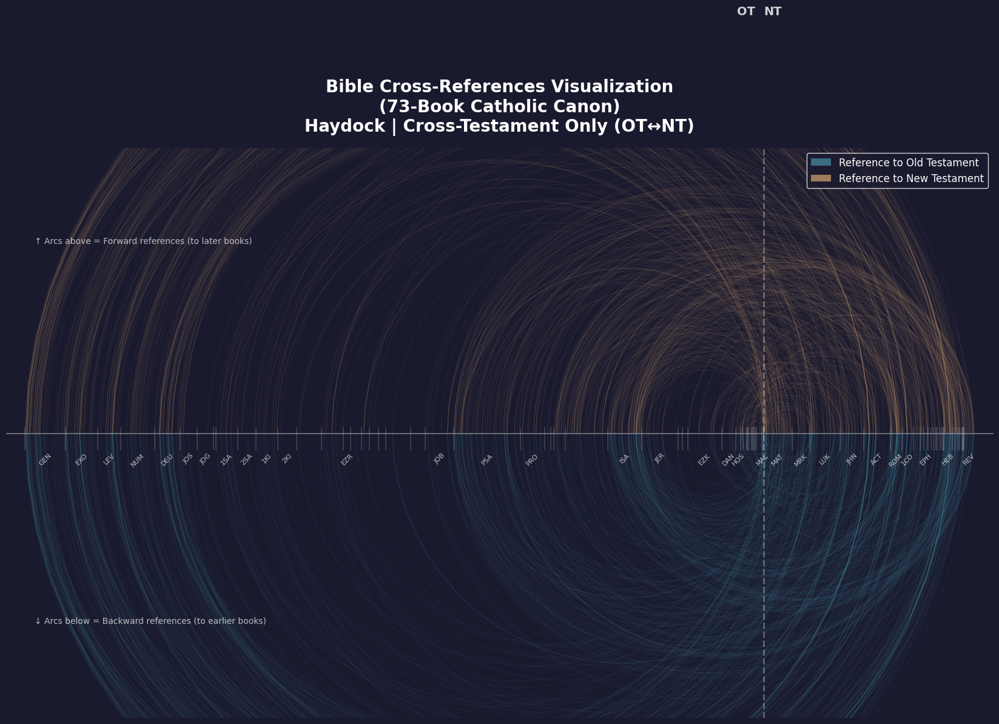

In [11]:
# Test with a sample first
fig, ax = draw_bible_arcs(from_positions, to_positions, is_to_nt,
                          figsize=(30, 12),
                          sample_size=min(10000, len(from_positions)),
                          alpha=0.1,
                          linewidth=0.5,
                          title_suffix=filter_label)

# Create safe filename
safe_filename = filter_label.lower().replace(" ", "_").replace("|", "-").replace("↔", "_").replace("→", "_to_")
plt.savefig(f'bible_arcs_sample_{safe_filename}.png', dpi=150, facecolor='#1a1a2e', bbox_inches='tight')
plt.show()

Using alpha=0.200 for 1,534 cross-references
Drawing 1,534 arcs...
Drawing OT segments: 22,620
Drawing NT segments: 21,866


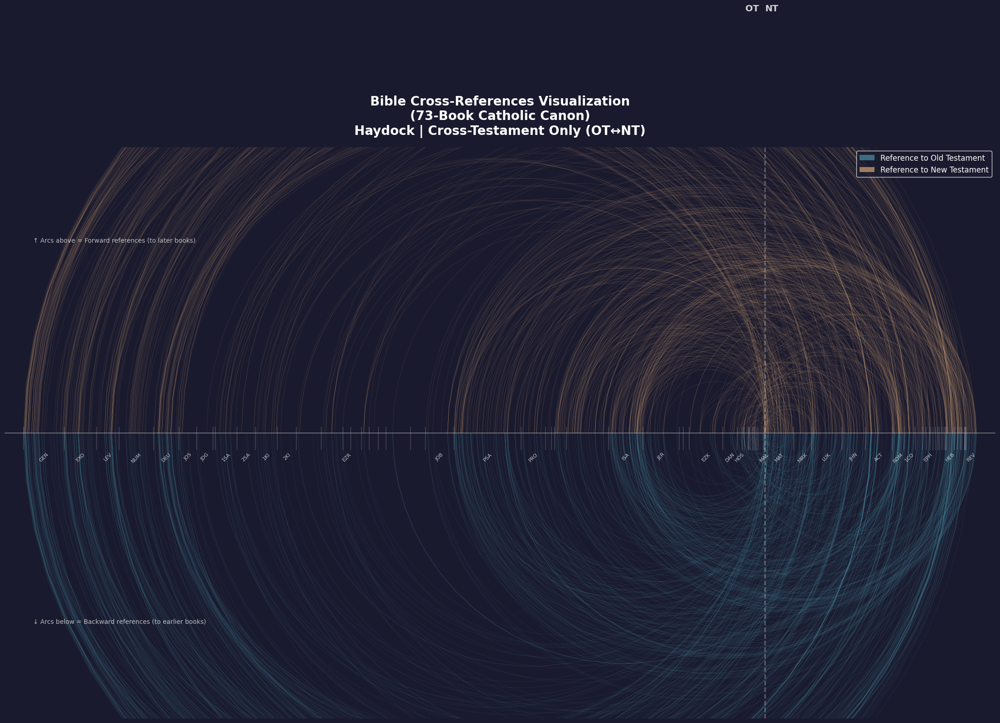

In [12]:
# Full visualization with all cross-references
# Adjust alpha based on number of references (more refs = lower alpha)
auto_alpha = max(0.02, min(0.2, 3000 / len(crossrefs)))
print(f"Using alpha={auto_alpha:.3f} for {len(crossrefs):,} cross-references")

fig, ax = draw_bible_arcs(from_positions, to_positions, is_to_nt,
                          figsize=(40, 16),
                          alpha=auto_alpha,
                          linewidth=0.4,
                          title_suffix=filter_label)

safe_filename = filter_label.lower().replace(" ", "_").replace("|", "-").replace("↔", "_").replace("→", "_to_")
plt.savefig(f'bible_arcs_full_{safe_filename}.png', dpi=200, facecolor='#1a1a2e', bbox_inches='tight')
plt.show()

## High-Resolution Version

Create a very high-resolution version suitable for printing or detailed examination.

In [13]:
# High-resolution version (warning: large file!)
fig, ax = draw_bible_arcs(from_positions, to_positions, is_to_nt,
                          figsize=(60, 24),
                          alpha=max(0.015, auto_alpha * 0.7),
                          linewidth=0.2,
                          title_suffix=filter_label)

safe_filename = filter_label.lower().replace(" ", "_").replace("|", "-").replace("↔", "_").replace("→", "_to_")
plt.savefig(f'bible_arcs_highres_{safe_filename}.png', dpi=300, facecolor='#1a1a2e', bbox_inches='tight')
plt.close()
print(f"Saved high-resolution version: bible_arcs_highres_{safe_filename}.png")

Drawing 1,534 arcs...
Drawing OT segments: 22,620
Drawing NT segments: 21,866
Saved high-resolution version: bible_arcs_highres_haydock_-_cross-testament_only_(ot_nt).png


## Print-Quality Visualization

A cleaner version optimized for printing as art - no titles, legends, or direction annotations. Additional book labels for better coverage.

In [14]:
def draw_bible_arcs_print(from_pos, to_pos, is_to_nt,
                          figsize=(40, 20),
                          alpha=0.03,
                          linewidth=0.3,
                          ot_color='#4a90a4',  # Blue-ish for OT
                          nt_color='#d4a574',  # Gold/tan for NT
                          bg_color='#1a1a2e',  # Dark blue-black
                          sample_size=None,
                          show_book_labels=True,
                          arc_smoothness=100,  # Points per arc - higher = smoother
                          margin_percent=2,    # Left/right margin as % of total width
                          respect_figsize=False,  # If True, output matches figsize exactly
                          arc_height_scale=1.0):  # Scale factor for arc heights (only used when respect_figsize=True)
    """
    Create a print-quality Bible cross-reference arc visualization.

    No titles, legends, or direction annotations - clean aesthetic for printing.

    Parameters:
    - from_pos, to_pos: arrays of verse positions
    - is_to_nt: boolean array, True if target is NT
    - alpha: transparency of arcs (lower = more transparent)
    - sample_size: if set, randomly sample this many arcs (for testing)
    - arc_smoothness: number of points per arc (higher = smoother curves, default 100)
    - margin_percent: left and right margin as percentage of total width (default 2%)
    - respect_figsize: if True, output dimensions match figsize exactly (default False for backwards compat)
    - arc_height_scale: when respect_figsize=True, scale arc heights by this factor (default 1.0)
                        Values < 1.0 make arcs shorter/flatter, > 1.0 make them taller
    """
    fig, ax = plt.subplots(figsize=figsize, facecolor=bg_color)
    ax.set_facecolor(bg_color)

    # Sample if requested
    if sample_size and sample_size < len(from_pos):
        indices = np.random.choice(len(from_pos), sample_size, replace=False)
        from_pos = from_pos[indices]
        to_pos = to_pos[indices]
        is_to_nt = is_to_nt[indices]

    n_arcs = len(from_pos)
    print(f"Drawing {n_arcs:,} arcs with {arc_smoothness} points each...")

    # Build line segments for LineCollection (much faster than individual arcs)
    ot_segments = []
    nt_segments = []

    for i in range(n_arcs):
        x, y = create_arc_points(from_pos[i], to_pos[i], arc_smoothness)
        if x is None:
            continue

        # Scale arc heights if requested (only when respect_figsize=True)
        if respect_figsize:
            y = y * arc_height_scale

        # Create segments as pairs of consecutive points
        points = np.column_stack([x, y])
        segments = np.array([points[:-1], points[1:]]).transpose(1, 0, 2)

        if is_to_nt[i]:
            nt_segments.extend(segments)
        else:
            ot_segments.extend(segments)

        if (i + 1) % 50000 == 0:
            print(f"  Processed {i+1:,} arcs...")

    print(f"Drawing OT segments: {len(ot_segments):,}")
    print(f"Drawing NT segments: {len(nt_segments):,}")

    # Draw OT arcs
    if ot_segments:
        ot_collection = LineCollection(ot_segments,
                                        colors=ot_color,
                                        alpha=alpha,
                                        linewidths=linewidth)
        ax.add_collection(ot_collection)

    # Draw NT arcs
    if nt_segments:
        nt_collection = LineCollection(nt_segments,
                                        colors=nt_color,
                                        alpha=alpha,
                                        linewidths=linewidth)
        ax.add_collection(nt_collection)

    # Draw the baseline (book axis)
    ax.axhline(y=0, color='white', linewidth=1, alpha=0.5)

    # Add book labels and dividers
    if show_book_labels:
        for book in BOOK_ORDER:
            pos = book_start_positions[book]
            # Vertical tick mark
            ax.axvline(x=pos, color='white', linewidth=0.3, alpha=0.7, ymin=0.47, ymax=0.51)

        # Extended book labels - added books in gaps:
        # Between 2KI and EZR: 1CH, 2CH
        # Between EZR and JOB: NEH, TOB, EST, 1MA, 2MA
        # Between PRO and ISA: ECC, WIS, SIR
        # Between JER and EZK: BAR (LAM omitted - too close to BAR)
        major_books = [
            # Torah/Pentateuch
            'GEN', 'EXO', 'LEV', 'NUM', 'DEU',
            # Historical books
            'JOS', 'JDG', '1SA', '2SA', '1KI', '2KI',
            # Added: Chronicles between 2KI and EZR
            '1CH', '2CH',
            'EZR',
            # Added: books between EZR and JOB
            'NEH', 'TOB', 'EST', '1MA', '2MA',
            'JOB', 'PSA', 'PRO',
            # Added: wisdom books between PRO and ISA
            'ECC', 'WIS', 'SIR',
            # Prophets (BAR between JER and EZK, ZEC instead of MAL)
            'ISA', 'JER', 'BAR', 'EZK', 'DAN', 'HOS', 'ZEC',
            # New Testament
            'MAT', 'MRK', 'LUK', 'JHN', 'ACT', 'ROM', '1CO', 'EPH', 'HEB', 'REV'
        ]
        for book in major_books:
            if book in book_start_positions:
                pos = book_start_positions[book] + verse_counts.get(book, 0) / 2
                ax.text(pos, -total_verses * 0.02, book,
                       ha='center', va='top', fontsize=8,
                       color='white', alpha=0.7, rotation=45)

    # Mark OT/NT division (subtle)
    nt_start = book_start_positions['MAT']
    ax.axvline(x=nt_start, color='white', linewidth=2, alpha=0.3, linestyle='--')

    # Set axis limits with configurable margins
    margin = total_verses * (margin_percent / 100)
    max_arc_height = total_verses / 2  # Longest possible arc

    if respect_figsize:
        # Keep y-limits fixed so arc_height_scale actually changes visual appearance
        # The arcs are scaled but the viewport stays the same
        ax.set_xlim(-margin, total_verses + margin)
        ax.set_ylim(-max_arc_height * 0.6, max_arc_height * 0.6)
        # Use 'auto' aspect so figsize controls output dimensions
        ax.set_aspect('auto')
    else:
        ax.set_xlim(-margin, total_verses + margin)
        ax.set_ylim(-max_arc_height * 0.6, max_arc_height * 0.6)
        # Use 'equal' for backwards compatibility (data determines shape)
        ax.set_aspect('equal')

    # Clean up axes
    ax.axis('off')

    plt.tight_layout()
    return fig, ax

Drawing 1,534 arcs with 100 points each...
Drawing OT segments: 77,220
Drawing NT segments: 74,646


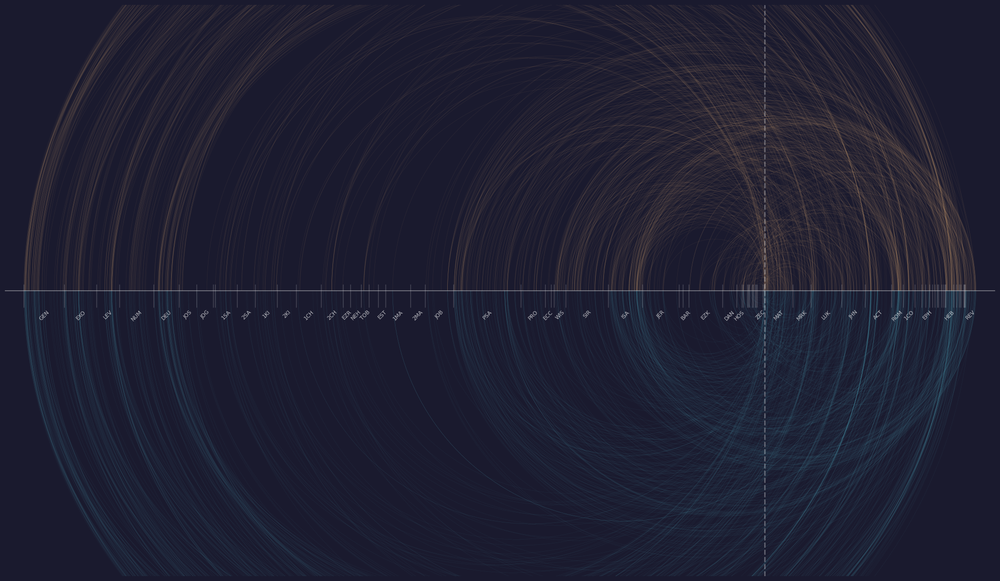

In [15]:
# Print-quality preview (sample for quick iteration)
fig, ax = draw_bible_arcs_print(from_positions, to_positions, is_to_nt,
                                figsize=(30, 12),
                                sample_size=min(10000, len(from_positions)),
                                alpha=0.1,
                                linewidth=0.5)

safe_filename = filter_label.lower().replace(" ", "_").replace("|", "-").replace("↔", "_").replace("→", "_to_")
plt.savefig(f'bible_arcs_print_preview_{safe_filename}.png', dpi=150, facecolor='#1a1a2e', bbox_inches='tight')
plt.show()

Using alpha=0.200 for 1,534 cross-references
Drawing 1,534 arcs with 100 points each...
Drawing OT segments: 77,220
Drawing NT segments: 74,646


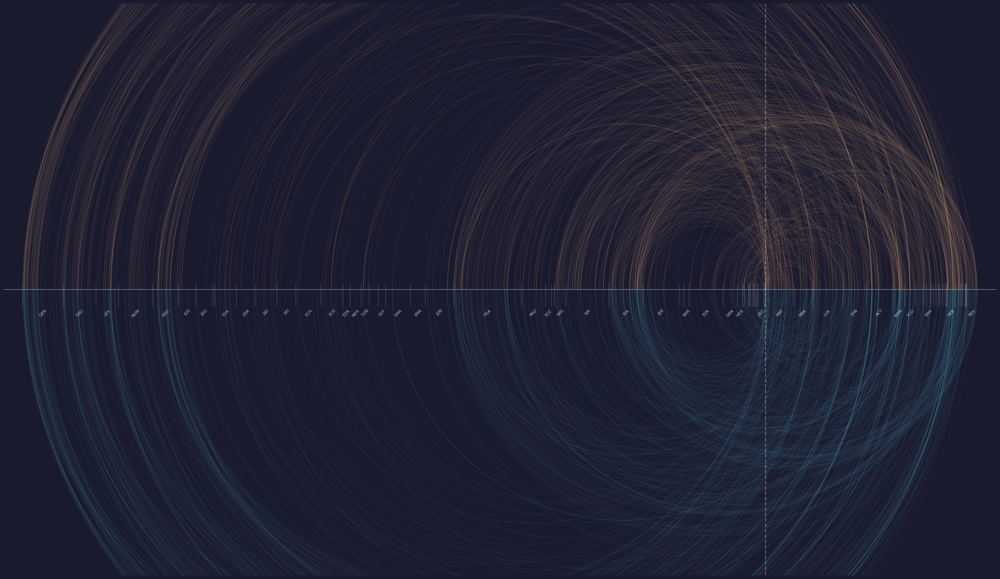

In [16]:
# Full print-quality version
print(f"Using alpha={auto_alpha:.3f} for {len(crossrefs):,} cross-references")

fig, ax = draw_bible_arcs_print(from_positions, to_positions, is_to_nt,
                                figsize=(40, 16),
                                alpha=auto_alpha,
                                linewidth=0.4)

safe_filename = filter_label.lower().replace(" ", "_").replace("|", "-").replace("↔", "_").replace("→", "_to_")
plt.savefig(f'bible_arcs_print_full_{safe_filename}.png', dpi=200, facecolor='#1a1a2e', bbox_inches='tight')
plt.show()

In [26]:
# Super high-resolution print version for canvas print
# Using 300 DPI for maximum quality

CANVAS_WIDTH = 36   # inches
CANVAS_HEIGHT = 30  # inches
PRINT_DPI = 300     # 200 DPI recommended for large canvas; use 300 for maximum quality
MARGIN_PERCENT = 2  # Left/right margin as % of visualization width (adjust as needed for canvas wrap)

# Set respect_figsize=True to get exact output dimensions matching CANVAS_WIDTH x CANVAS_HEIGHT
# arc_height_scale controls how tall the arcs appear (1.0 = normal, 2.0 = twice as tall, etc.)
# Increase this if your canvas is taller than wide and you want the arcs to fill more vertical space

fig, ax = draw_bible_arcs_print(from_positions, to_positions, is_to_nt,
                                figsize=(CANVAS_WIDTH, CANVAS_HEIGHT),
                                alpha=0.15,  # Increased for visibility on large print
                                linewidth=0.8,  # Thicker lines for large format
                                arc_smoothness=150,  # Smoother arcs (default 100, was 30)
                                margin_percent=MARGIN_PERCENT,
                                respect_figsize=True,  # Output will be exactly CANVAS_WIDTH x CANVAS_HEIGHT
                                arc_height_scale=0.65)  # Adjust to stretch arcs vertically if desired

safe_filename = filter_label.lower().replace(" ", "_").replace("|", "-").replace("↔", "_").replace("→", "_to_")
output_file = f'bible_arcs_print_{CANVAS_WIDTH}x{CANVAS_HEIGHT}_{safe_filename}.png'
plt.savefig(output_file, dpi=PRINT_DPI, facecolor='#1a1a2e', bbox_inches='tight')
plt.close()

# Report file info
import os
file_size_mb = os.path.getsize(output_file) / (1024 * 1024)
print(f"Saved canvas print version: {output_file}")
print(f"Canvas size: {CANVAS_WIDTH}\" x {CANVAS_HEIGHT}\" at {PRINT_DPI} DPI")
print(f"Resolution: {CANVAS_WIDTH * PRINT_DPI:,} x {CANVAS_HEIGHT * PRINT_DPI:,} pixels")
print(f"Margin: {MARGIN_PERCENT}% on left and right sides")
print(f"File size: {file_size_mb:.1f} MB")

Drawing 1,534 arcs with 150 points each...
Drawing OT segments: 116,220
Drawing NT segments: 112,346
Saved canvas print version: bible_arcs_print_36x30_haydock_-_cross-testament_only_(ot_nt).png
Canvas size: 36" x 30" at 300 DPI
Resolution: 10,800 x 9,000 pixels
Margin: 2% on left and right sides
File size: 40.5 MB


## Statistics

Some interesting statistics about the cross-reference patterns.

In [18]:
# Direction statistics
forward_refs = np.sum(to_positions > from_positions)
backward_refs = np.sum(to_positions < from_positions)
same_verse_refs = np.sum(to_positions == from_positions)

print("Cross-Reference Direction Statistics:")
print("="*45)
print(f"Forward references (to later):   {forward_refs:>10,} ({forward_refs/len(crossrefs)*100:.1f}%)")
print(f"Backward references (to earlier): {backward_refs:>10,} ({backward_refs/len(crossrefs)*100:.1f}%)")
print(f"Same verse:                       {same_verse_refs:>10,} ({same_verse_refs/len(crossrefs)*100:.1f}%)")

Cross-Reference Direction Statistics:
Forward references (to later):          754 (49.2%)
Backward references (to earlier):        780 (50.8%)
Same verse:                                0 (0.0%)


In [19]:
# Distance statistics
distances = np.abs(to_positions - from_positions)

print("\nCross-Reference Distance Statistics:")
print("="*45)
print(f"Mean distance:   {np.mean(distances):>10,.0f} verses")
print(f"Median distance: {np.median(distances):>10,.0f} verses")
print(f"Max distance:    {np.max(distances):>10,.0f} verses")
print(f"Min distance:    {np.min(distances):>10,.0f} verses")

# Short vs long references
short_refs = np.sum(distances < 500)
medium_refs = np.sum((distances >= 500) & (distances < 5000))
long_refs = np.sum(distances >= 5000)

print(f"\nShort (<500 verses):    {short_refs:>10,} ({short_refs/len(crossrefs)*100:.1f}%)")
print(f"Medium (500-5000):      {medium_refs:>10,} ({medium_refs/len(crossrefs)*100:.1f}%)")
print(f"Long (>5000 verses):    {long_refs:>10,} ({long_refs/len(crossrefs)*100:.1f}%)")


Cross-Reference Distance Statistics:
Mean distance:       17,702 verses
Median distance:     15,540 verses
Max distance:        35,423 verses
Min distance:           256 verses

Short (<500 verses):             4 (0.3%)
Medium (500-5000):             122 (8.0%)
Long (>5000 verses):         1,408 (91.8%)


In [20]:
# Testament cross-references
from_ot = np.array([cr['from_book'] in OT_BOOKS for cr in crossrefs])

ot_to_ot = np.sum(from_ot & ~is_to_nt)
ot_to_nt = np.sum(from_ot & is_to_nt)
nt_to_ot = np.sum(~from_ot & ~is_to_nt)
nt_to_nt = np.sum(~from_ot & is_to_nt)

print("\nTestament Cross-Reference Patterns:")
print("="*45)
print(f"OT -> OT: {ot_to_ot:>10,} ({ot_to_ot/len(crossrefs)*100:.1f}%)")
print(f"OT -> NT: {ot_to_nt:>10,} ({ot_to_nt/len(crossrefs)*100:.1f}%)")
print(f"NT -> OT: {nt_to_ot:>10,} ({nt_to_ot/len(crossrefs)*100:.1f}%)")
print(f"NT -> NT: {nt_to_nt:>10,} ({nt_to_nt/len(crossrefs)*100:.1f}%)")


Testament Cross-Reference Patterns:
OT -> OT:          0 (0.0%)
OT -> NT:        754 (49.2%)
NT -> OT:        780 (50.8%)
NT -> NT:          0 (0.0%)


## Cleanup

In [21]:
conn.close()
print("Connection closed")

Connection closed
